# Base

# 1. 圖

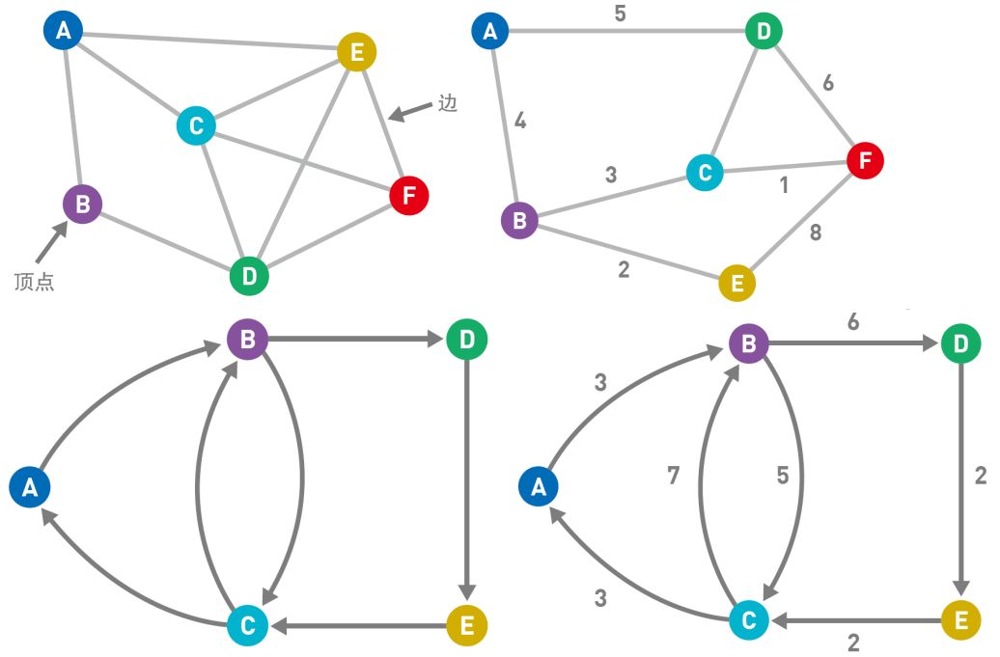

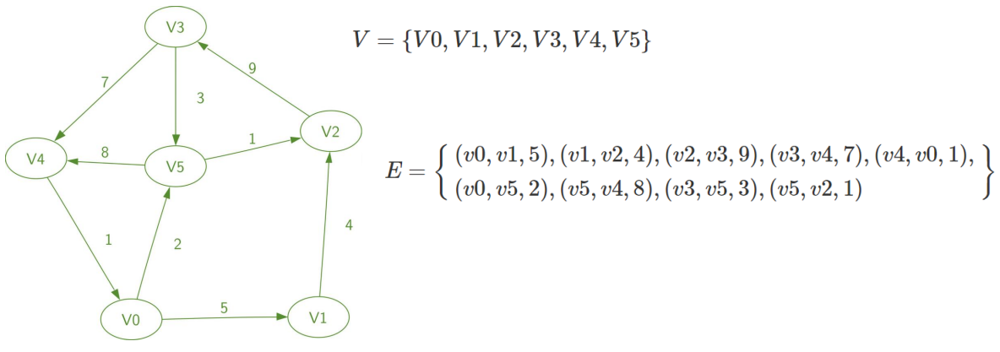

- Graph() 创建一个新的空图。

- addVertex(vert) 向图中添加一个顶点实例。

- addEdge(fromVert, toVert) 向连接两个顶点的图添加一个新的有向边。

- addEdge(fromVert, toVert, weight) 向连接两个顶点的图添加一个新的加权的有向边。

- getVertex(vertKey) 在图中找到名为 vertKey 的顶点。

- getVertices() 返回图中所有顶点的列表。

- in 返回 True 如果 vertex in graph 里给定的顶点在图中，否则返回False。

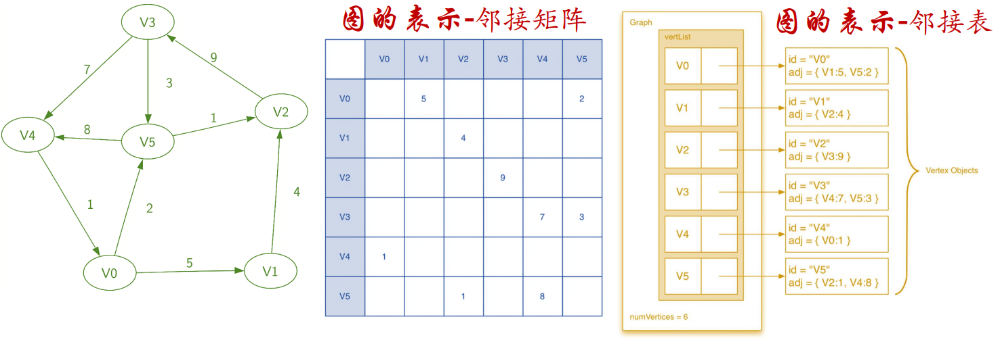

In [1]:
class Vertex:
    def __init__(self, key):
        self.id = key
        self.connectedTo = {}

    def addNeighbor(self,nbr,weight=0):
        self.connectedTo[nbr] = weight

    def __str__(self):
        return str(self.id) + ' connectedTo: ' + str([x.id for x in self.connectedTo])

    def getConnections(self):
        return self.connectedTo.keys()

    def getId(self):
        return self.id

    def getWeight(self,nbr):
        return self.connectedTo[nbr]
class Graph:
    def __init__(self):
        self.vertList = {}
        self.numVertices = 0

    def addVertex(self, key):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(key)
        self.vertList[key] = newVertex
        return newVertex

    def getVertex(self,n):
        if n in self.vertList:
            return self.vertList[n]
        else:
            return None

    def __contains__(self,n):
        return n in self.vertList

    def addEdge(self, f, t, cost=0):
        if f not in self.vertList:
            nv = self.addVertex(f)
        if t not in self.vertList:
            nv = self.addVertex(t)
        self.vertList[f].addNeighbor(self.vertList[t], cost)

    def getVertices(self):
        return self.vertList.keys()

    def __iter__(self):
        return iter(self.vertList.values())
g = Graph()
for i in range(6):
    g.addVertex(i)
print(g.vertList)
g.addEdge(0, 1, 5)
g.addEdge(0, 5, 2)
g.addEdge(1, 2, 4)
g.addEdge(2, 3, 9)
g.addEdge(3, 4, 7)
g.addEdge(3, 5, 3)
g.addEdge(4, 0, 1)
g.addEdge(5, 4, 8)
g.addEdge(5, 2, 1)
g.addEdge(6, 2, 1)

for v in g:
    for w in v.getConnections():
        print("( %s , %s )" % (v.getId(), w.getId()))

{0: <__main__.Vertex object at 0x000002487D66FFA0>, 1: <__main__.Vertex object at 0x000002487D66F400>, 2: <__main__.Vertex object at 0x000002487D66F520>, 3: <__main__.Vertex object at 0x000002487D649850>, 4: <__main__.Vertex object at 0x000002487D649BE0>, 5: <__main__.Vertex object at 0x000002487D649DC0>}
( 0 , 1 )
( 0 , 5 )
( 1 , 2 )
( 2 , 3 )
( 3 , 4 )
( 3 , 5 )
( 4 , 0 )
( 5 , 4 )
( 5 , 2 )
( 6 , 2 )


##  LeetCode 997. Find the Town Judge 找到小镇的法官

In a town, there are n people labeled from 1 to n. There is a rumor that one of these people is secretly the town judge.

If the town judge exists, then:

1. The town judge trusts nobody.

2. Everybody (except for the town judge) trusts the town judge.

3. There is exactly one person that satisfies properties 1 and 2.

You are given an array trust where trust[i] = [$a_i$, $b_i$] representing that the person labeled ai trusts the person labeled bi.

Return the label of the town judge if the town judge exists and can be identified, or return -1 otherwise.

小镇里有 n 个人，按从 1 到 n 的顺序编号。传言称，这些人中有一个暗地里是小镇法官。

如果小镇法官真的存在，那么：

小镇法官不会信任任何人。
每个人（除了小镇法官）都信任这位小镇法官。
只有一个人同时满足属性 1 和属性 2 。
给你一个数组 trust ，其中 trust[i] = [$a_i$, $b_i$] 表示编号为 $a_i$ 的人信任编号为 $b_i$ 的人。

如果小镇法官存在并且可以确定他的身份，请返回该法官的编号；否则，返回 -1 。


Example 1:

```
Input: n = 2, trust = [[1,2]]
Output: 2
```

Example 2:

```
Input: n = 3, trust = [[1,3],[2,3]]
Output: 3
```

Example 3:

```
Input: n = 3, trust = [[1,3],[2,3],[3,1]]
Output: -1
```

Constraints:

- 1 <= n <= 1000

- 0 <= trust.length <= $10^4$

- trust[i].length == 2

- All the pairs of trust are unique. (trust 中的所有 trust[i] = [$a_i$, $b_i$] 互不相同)

- $a_i$ != $b_i$

- 1 <= $a_i$, $b_i$ <= n


In [2]:
'''
In a town, there are N people labelled from 1 to N.  There is a rumor that one of these people is secretly the town judge.
If the town judge exists, then:
The town judge trusts nobody.
Everybody (except for the town judge) trusts the town judge.
There is exactly one person that satisfies properties 1 and 2.
You are given trust, an array of pairs trust[i] = [a, b] representing that the person labelled a trusts the person labelled b.
If the town judge exists and can be identified, return the label of the town judge.  Otherwise, return -1.

Example 1:
Input: N = 2, trust = [[1,2]]
Output: 2
Example 2:
Input: N = 3, trust = [[1,3],[2,3]]
Output: 3
'''


class Solution(object):
    def findJudge(self, N, trust):
        if not trust:
            return 1
        mapping = {}
        unique = set()
        for truste_list in trust:
            unique.add(truste_list[0])
            if truste_list[1] in mapping:
                mapping[truste_list[1]] += 1
            else:
                mapping[truste_list[1]] = 1

        unique_set = len(unique)
        for key, value in mapping.items():
            if (value == N-1) & (unique_set == N-1):
                return key
        return -1


    def findJudge2(self, N, trust):
        from collections import Counter
        people = set([x[0] for x in trust])
        if not len(people):
            if N == 1:
                return 1
            else:
                return -1

        if len(people) == N - 1:
            trustee = Counter([x[1] for x in trust])
            for t in trustee.keys():
                if trustee[t] == N - 1:
                    return t
            return -1
        return -1


if __name__ == '__main__':
    trust = [[1, 3], [2, 3]]
    # trust = [[1,3],[2,1], [2,1]]
    # trust = [[1,8],[1,3],[2,8],[2,3],[4,8],[4,3],[5,8],[5,3],[6,8],[6,3],[7,8],[7,3],[9,8],[9,3],[11,8],[11,3]]

    print(Solution().findJudge(3, trust))
    # print(Solution().findJudge2(3, trust))

3


# 2. BFS and DFS

广度优先搜索(Breadth-First-Search)

深度优先搜索(Depth-First-Search)

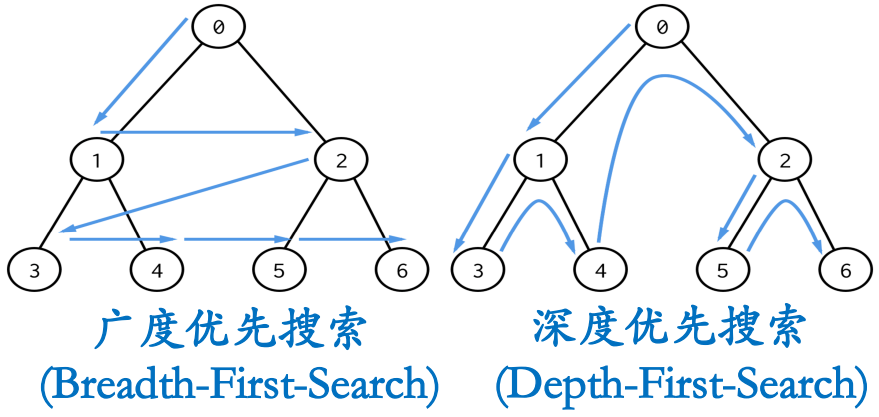

在树或图中寻找特定节点

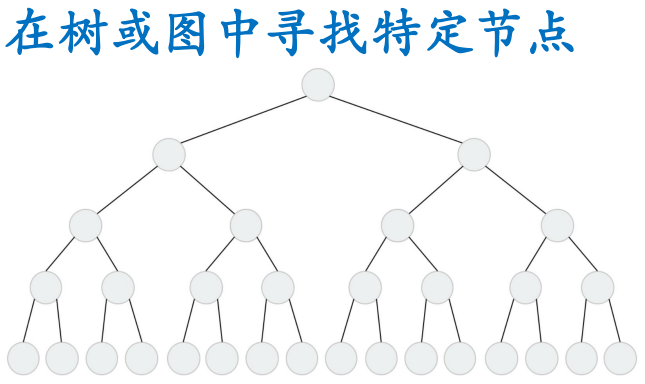

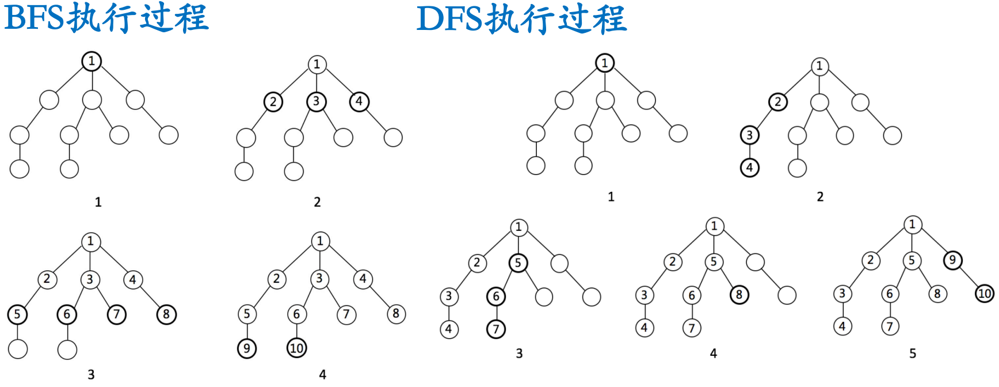

In [3]:
def BFS(graph, start, end):
    queue = []
    queue.append([start])
    visited.add(start)
    while queue:
        node = queue.pop()
        visited.add(node)
        process(node)
        nodes = generate_related_nodes(node)
        queue.push(nodes)

In [4]:
# DFS 代码递归写法
visited = set()
def dfs(node, visited):
    visited.add(node)
    # process current node here.
    for next_node in node.children():
        if not next_node in visited:
            dfs(next_node, visited)

In [5]:
# DFS 代码非递归写法
def DFS(self, tree):
    if tree.root is None:
        return []
    visited, stack = [], [tree.root]
    while stack:
        node = stack.pop()
        visited.add(node)
        process(node)
        nodes = generate_related_nodes(node)
        stack.push(nodes)
        # other processing work

## LeetCode 102. Binary Tree Level Order Traversal 二叉树的层序遍历

Given the root of a binary tree, return the level order traversal of its nodes' values. (i.e., from left to right, level by level).

给你二叉树的根节点 root ，返回其节点值的 层序遍历 。 （即逐层地，从左到右访问所有节点）。

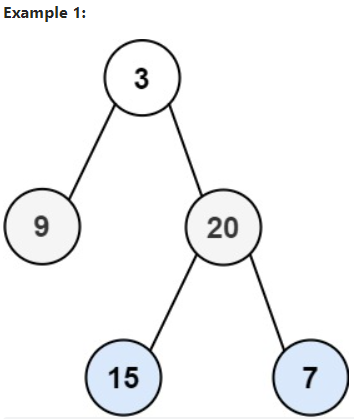

Example 1:

```
Input: root = [3,9,20,null,null,15,7]
Output: [[3],[9,20],[15,7]]
Example 2:
```

Example 2:

```
Input: root = [1]
Output: [[1]]
Example 3:
```

Example 3:

```
Input: root = []
Output: []
```

Constraints:

- The number of nodes in the tree is in the range [0, 2000]. (树中节点数目在范围 [0, 2000] 内)

- -1000 <= Node.val <= 1000


In [6]:
# Definition for a binary tree node.
class TreeNode(object):
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None
class Solution(object):
    def levelOrder(self, root):
        if not root:
            return []
        queue = [(root, 0)]
        levelMap = {}
        while queue:
            node, level = queue.pop(0)
            if node.left:
                queue.append((node.left, level+1))
            if node.right:
                queue.append((node.right, level+1))
            if level in levelMap:
                levelMap[level].append(node.val)
            else:
                levelMap[level] = [node.val]
        result = []
        for key, value in levelMap.items():
            result.append(value)
        return result
if __name__ == '__main__':
    tree = TreeNode(3)
    tree.left = TreeNode(9)
    tree.right = TreeNode(20)
    tree.right.left = TreeNode(15)
    tree.right.right = TreeNode(7)
    print(Solution().levelOrder(tree))

[[3], [9, 20], [15, 7]]


## LeetCode 104. Maximum Depth of Binary Tree 二叉树的最大深度

Given the root of a binary tree, return its maximum depth.

A binary tree's maximum depth is the number of nodes along the longest path from the root node down to the farthest leaf node.

给定一个二叉树，找出其最大深度。

二叉树的深度为根节点到最远叶子节点的最长路径上的节点数。

说明: 叶子节点是指没有子节点的节点。


Example 1:

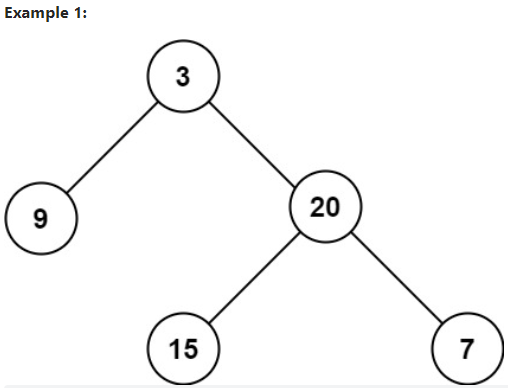

```
给定二叉树 [3,9,20,null,null,15,7]，

    3
   / \
  9  20
    /  \
   15   7
返回它的最大深度 3 。

```

Example 2:

```
Input: root = [1,null,2]
Output: 2
```
 
Constraints:

- The number of nodes in the tree is in the range [0, $10^4$].
- -100 <= Node.val <= 100



In [7]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None

class Solution:
    def maxDepth(self, root):
        """
        :type root: TreeNode
        :rtype: int
        """
        if root is None:
            return 0
        else:
            return max(self.maxDepth(root.left), self.maxDepth(root.right)) + 1

if __name__ == '__main__':
    root = TreeNode(3)
    root.left = TreeNode(9)
    root.right = TreeNode(20)
    root.left.left = TreeNode(7)
    root.left.right = TreeNode(15)
    print(Solution().maxDepth(root))

3


## LeetCode 111. Minimum Depth of Binary Tree 二叉树的最小深度

Given a binary tree, find its minimum depth.

The minimum depth is the number of nodes along the shortest path from the root node down to the nearest leaf node.

Note: A leaf is a node with no children.

给定一个二叉树，找出其最小深度。

最小深度是从根节点到最近叶子节点的最短路径上的节点数量。

说明：叶子节点是指没有子节点的节点。

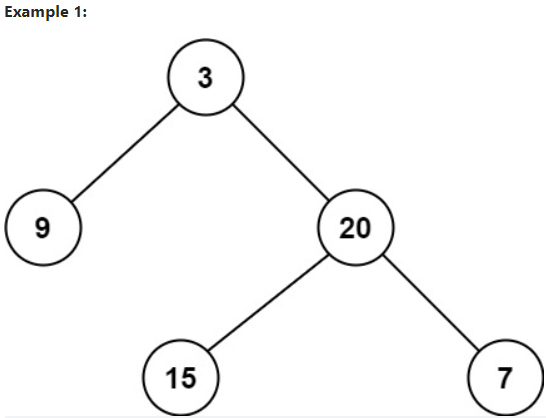

Example 1:

```
Input: root = [3,9,20,null,null,15,7]
Output: 2
Example 2:
```

Example 2:

```
Input: root = [2,null,3,null,4,null,5,null,6]
Output: 5
```

Constraints:

- The number of nodes in the tree is in the range [0, $10^5$]. (树中节点数的范围在 [0, $10^5$] 内)

- -1000 <= Node.val <= 1000



In [8]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None

class Solution:
    def minDepth(self, root):
        """
        :type root: TreeNode
        :rtype: int
        """
        if root is None:
            return 0

        if root.left and root.right:
            return min(self.minDepth(root.left), self.minDepth(root.right)) + 1
        else:
            return max(self.minDepth(root.left), self.minDepth(root.right)) + 1


if __name__ == '__main__':
    root = TreeNode(3)
    root.left = TreeNode(9)
    root.right = TreeNode(20)
    root.right.left = TreeNode(7)
    root.right.right = TreeNode(15)
    print(Solution().minDepth(root))

2


# 3. LeetCode 787. Cheapest Flights Within K Stops, K 站中转内最便宜的航班

There are n cities connected by some number of flights. You are given an array flights where flights[i] = [fromi, toi, pricei] indicates that there is a flight from city fromi to city toi with cost pricei.

You are also given three integers src, dst, and k, return the cheapest price from src to dst with at most k stops. If there is no such route, return -1.

有 n 个城市通过一些航班连接。给你一个数组 flights ，其中 flights[i] = [fromi, toi, pricei] ，表示该航班都从城市 fromi 开始，以价格 pricei 抵达 toi。

现在给定所有的城市和航班，以及出发城市 src 和目的地 dst，你的任务是找到出一条最多经过 k 站中转的路线，使得从 src 到 dst 的 价格最便宜 ，并返回该价格。 如果不存在这样的路线，则输出 -1。

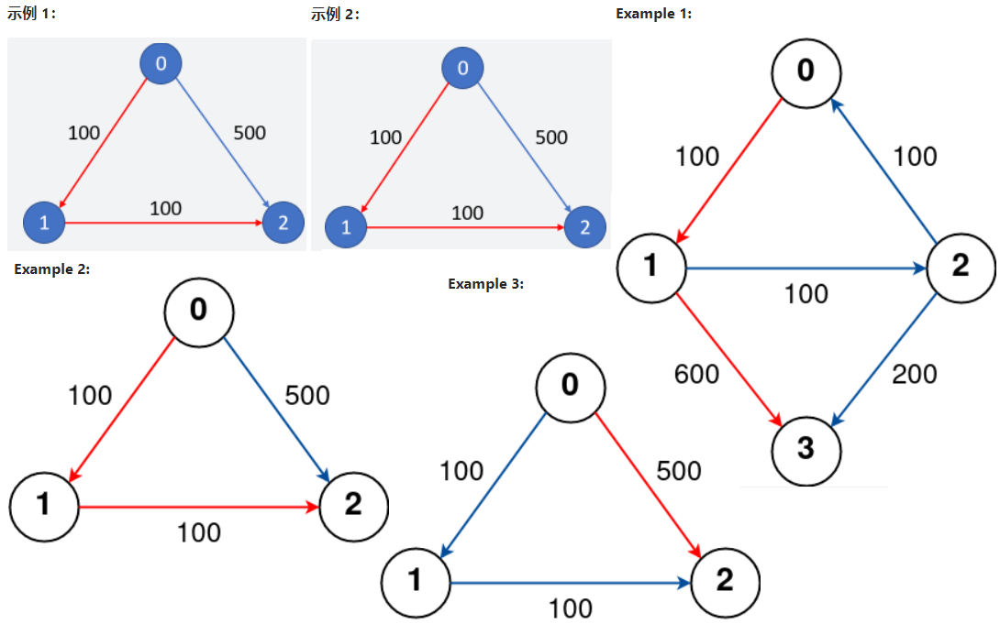

Example 1:

```
Input: n = 4, flights = [[0,1,100],[1,2,100],[2,0,100],[1,3,600],[2,3,200]], src = 0, dst = 3, k = 1
Output: 700
Explanation:
The graph is shown above.
The optimal path with at most 1 stop from city 0 to 3 is marked in red and has cost 100 + 600 = 700.
Note that the path through cities [0,1,2,3] is cheaper but is invalid because it uses 2 stops.

```

Example 2:

```
Input: n = 3, flights = [[0,1,100],[1,2,100],[0,2,500]], src = 0, dst = 2, k = 1
Output: 200
Explanation:
The graph is shown above.
The optimal path with at most 1 stop from city 0 to 2 is marked in red and has cost 100 + 100 = 200.
```

Example 3:

```
Input: n = 3, flights = [[0,1,100],[1,2,100],[0,2,500]], src = 0, dst = 2, k = 0
Output: 500
Explanation:
The graph is shown above.
The optimal path with no stops from city 0 to 2 is marked in red and has cost 500.
```

示例 1：

```
输入: 
n = 3, edges = [[0,1,100],[1,2,100],[0,2,500]]
src = 0, dst = 2, k = 1
输出: 200
解释: 
城市航班图如下
从城市 0 到城市 2 在 1 站中转以内的最便宜价格是 200，如图中红色所示。
```

示例 2：

```
输入: 
n = 3, edges = [[0,1,100],[1,2,100],[0,2,500]]
src = 0, dst = 2, k = 0
输出: 500
解释: 
城市航班图如下
从城市 0 到城市 2 在 0 站中转以内的最便宜价格是 500，如图中蓝色所示。
```

Constraints:

- 1 <= n <= 100
- 0 <= flights.length <= (n * (n - 1) / 2)
- flights[i].length == 3
- 0 <= fromi, toi < n
- $from_i$ != $to_i$
- 1 <= pricei <= $10^4$
- There will not be any multiple flights between two cities.(航班没有重复，且不存在自环)
- 0 <= src, dst, k < n
- src != dst


二维动态规划，矩阵维护最小开销，传递 k + 1 次

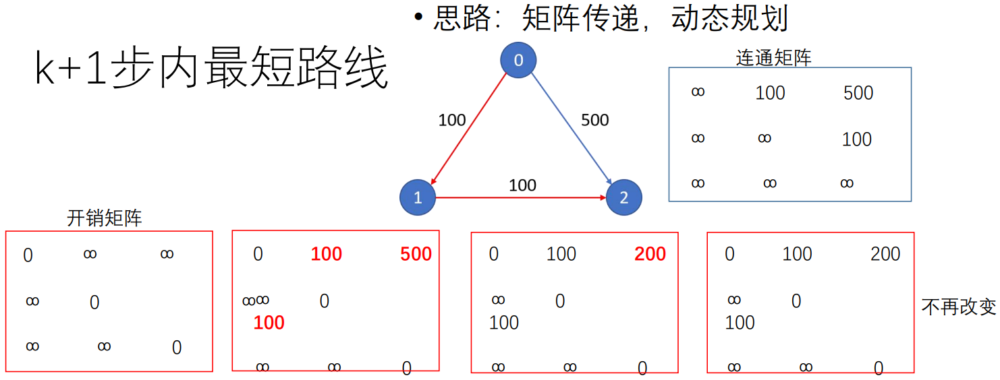

```
class Solution {
	public int findCheapestPrice(int n, int[][] flights, int src, int dst, int k) {
		int dist[][] = new int[n][n];
		for (int i = 0; i < n; i++) {
			for (int j = 0; j < n; j++) {
				if (i == j) dist[i][j] = 0;
				else dist[i][j] = 0x3f3f3f3f;
			}
		}
		for (int ii = 0; ii <= k; ii++) {
			boolean changed = false;
			int dist1[][] = new int[n][n];
			for (int i = 0; i < n; i++) {
				for (int j = 0; j < n; j++) {
					dist1[i][j] = dist[i][j];
					for (int kk = 0; kk < n; kk++) {
						if (flights.length > kk && flights[kk].length > j && flights[kk][j] >= 0 && dist[i][kk] + flights[kk][j] < dist1[i][j]) {
							changed = true;
							dist1[i][j] = dist[i][kk] + flights[kk][j];
						}
					}
				}
			}
			dist = dist1;
			if (!changed) break;
		}
		return dist[src][dst] == 0x3f3f3f3f ? -1 : dist[src][dst];
	}
}
```

In [9]:
from typing import List
class Solution:
    def findCheapestPrice(self, n: int, flights: List[List[int]], src: int, dst: int, K: int) -> int:
        if src == dst: return 0
        graph = collections.defaultdict(dict)
        for start,end,cost in flights:
            graph[start][end] = cost

        queue = [(0,0,src)]
        while queue:
            cost, k, end = heapq.heappop(queue)
            if k > K+1 : continue
            if end == dst: return cost
            for key, val in graph[end].items():
                heapq.heappush(queue,(cost+val,k+1,key))
        return -1

# 4. LeetCode 934. Shortest Bridge 最短的桥

You are given an n x n binary matrix grid where 1 represents land and 0 represents water.

An island is a 4-directionally connected group of 1's not connected to any other 1's. There are exactly two islands in grid.

You may change 0's to 1's to connect the two islands to form one island.

Return the smallest number of 0's you must flip to connect the two islands.

在给定的二维二进制数组 A 中，存在两座岛。（岛是由四面相连的 1 形成的一个最大组。）

现在，我们可以将 0 变为 1，以使两座岛连接起来，变成一座岛。

返回必须翻转的 0 的最小数目。（可以保证答案至少是 1 。）


Example 1:

```
Input: grid = [[0,1],[1,0]]
Output: 1
```

Example 2:

```
Input: grid = [[0,1,0],[0,0,0],[0,0,1]]
Output: 2
```

Example 3:

```
Input: grid = [[1,1,1,1,1],[1,0,0,0,1],[1,0,1,0,1],[1,0,0,0,1],[1,1,1,1,1]]
Output: 1
```

Constraints:

- n == grid.length == grid[i].length
- 2 <= n <= 100
- grid[i][j] is either 0 or 1.
- There are exactly two islands in grid.

```
/* 思路: DFS + BFS */
/* 先用深度优先搜索DFS, 找到第1个岛屿, 将岛屿元素置为2, 并入队   */
/* 再用广度优先搜索BFS, 从第1个岛屿元素开始向外寻找, 找到的0置为2 */
/* 当找到第一个1时, 就返回寻找的路径step                       */

/* 队列结构体定义 */
typedef struct {
    int x;
    int y;
    int step;
} Queue;

/* DFS 寻找第一个岛屿元素 */
void dfs(int **A, int ASize, int i, int j, Queue *Q, int *rear) {
    if (i < 0 || i >= ASize || j < 0 || j >= ASize || A[i][j] != 1) {
        return;
    }
    /* 元素置为2, 并入队, step置为0 */
    A[i][j]           = 2;
    Q[(*rear)].x      = i;
    Q[(*rear)].y      = j;
    Q[(*rear)++].step = 0;

    /* 上下左右继续寻找 */
    dfs(A, ASize, i - 1, j, Q, rear); 
    dfs(A, ASize, i + 1, j, Q, rear);
    dfs(A, ASize, i, j - 1, Q, rear);
    dfs(A, ASize, i, j + 1, Q, rear);
    return;
}

int shortestBridge(int** A, int ASize, int* AColSize){
    Queue *Q = (Queue*)malloc(sizeof(Queue) * ASize * ASize);
    int front = 0;
    int rear  = 0;
    int find  = 0;
    int i, j, x, y, xx, yy, step;
    int xShift[] = {-1, 1,  0, 0};
    int yShift[] = { 0, 0, -1, 1};

    /* DFS第一个岛屿 */
    for (i = 0; i < ASize; i++) {
        for (j = 0; j < ASize; j++) {
            if (A[i][j] == 1) {
                dfs(A, ASize, i, j, Q, &rear);
                find = 1;
                break;
            }
        }
        /* 只寻找第一个岛屿 */
        if (find == 1) {
            break;
        }
    }

    /* BFS 第一个岛屿向外扩散 */
    while (front != rear) {
        x    = Q[front].x;
        y    = Q[front].y;
        step = Q[front++].step;

        /* 上下左右扩散 */
        for (i = 0; i < 4; i++) {
            xx = x + xShift[i];
            yy = y + yShift[i];
            if (xx < 0 || xx >= ASize || yy < 0 || yy >= ASize || A[xx][yy] == 2) {
                continue;
            }
            if (A[xx][yy] == 1) { /* 找到另一岛屿时, 返回step */
                return step;
            }
            A[xx][yy]      = 2; /* 将扩散到的0置为2, 并入队 */
            Q[rear].x      = xx;
            Q[rear].y      = yy;
            Q[rear++].step = step + 1;
        }
    }
    free(Q);
    return step;
}
```

把一坨 1 全标为 2 作为区分，然后扩散2的这一坨，看看扩散几次后会到 1 的位置
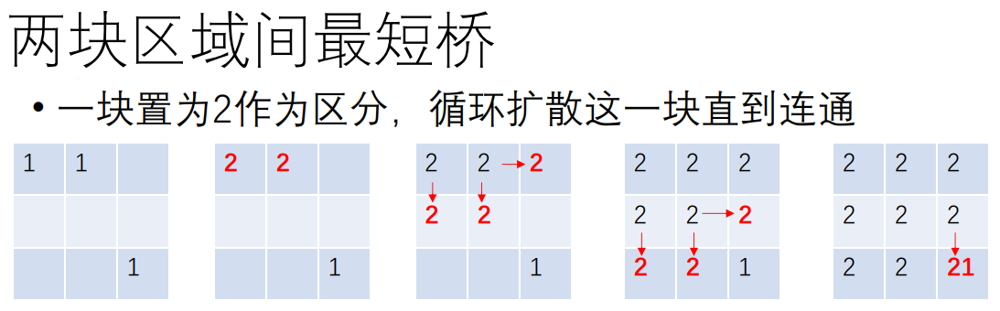

```
class Solution {
	int[][] grid;
	public void mark2(int i, int j) {
		grid[i][j] = 2;
		if (i > 0 && grid[i-1][j] == 1) mark2(i-1, j);
		if (j > 0 && grid[i][j-1] == 1) mark2(i, j-1);
		if (i < grid.length-1 && grid[i+1][j] == 1) mark2(i+1, j);
		if (j < grid[i].length-1 && grid[i][j+1] == 1) mark2(i, j+1);
	}
	public boolean spread2() {
		int grid1[][] = new int[grid.length][grid[0].length];
		for (int i = 0; i < grid.length; i++) {
			for (int j = 0; j < grid[i].length; j++) {
				if (grid[i][j] == 2) {
					grid1[i][j] = 2;
					if (i > 0) grid1[i-1][j] = 2;
					if (j > 0) grid1[i][j-1] = 2;
					if (i < grid.length-1) grid1[i+1][j] = 2;
					if (j < grid[i].length-1) grid1[i][j+1] = 2;
				}
			}
		}
		for (int i = 0; i < grid.length; i++) {
			for (int j = 0; j < grid[i].length; j++) {
				if (grid[i][j] == 1) {
					if (grid1[i][j] == 2) return true;
					grid1[i][j] = 1;
				}
			}
		}
		grid = grid1;
		return false;
	}
	public int shortestBridge(int[][] grid) {
		this.grid = grid;
		for (int i = 0; i < grid.length; i++) {
			for (int j = 0; j < grid[i].length; j++) {
				if (grid[i][j] == 1) {
					mark2(i, j);
					int count = 0;
					while (!spread2()) count++;
					return count;
				}
			}
		}
		return -1;
	}
}
```

In [10]:
from collections import deque
from typing import List
class Solution:
    def shortestBridge(self, grid: List[List[int]]) -> int:
        def dfs(grid, x, y):
            grid[x][y] = 0
            seen.append([x, y])
            seen_set.add(f'{x}#{y}')
            axis = [[x - 1, y], [x + 1, y], [x, y -1], [x, y + 1]]
            for x, y in axis:
                if 0 <= x < m and 0 <= y < n and grid[x][y] == 1:
                    dfs(grid, x, y)
        
        def bfs(grid, seen):
            seen = deque(seen)
            seen_other_flag = False
            level = 0
            while seen:
                for _ in range(len(seen)):
                    x, y = seen.popleft()
                    axis = [[x - 1, y], [x + 1, y], [x, y -1], [x, y + 1]]
                    for x, y in axis:
                        index = f'{x}#{y}'
                        if 0 <= x < m and 0 <= y < n and index not in seen_set:
                            if grid[x][y] == 0:
                                seen.append([x, y])
                                seen_set.add(f'{x}#{y}')
                            else:
                                return level
                level += 1
                

            return level
 
        seen = []
        seen_set = set()
        m = len(grid)
        n = len(grid[0])
        search_flag = 0
        for i in range(m):
            for j in range(n):
                if grid[i][j] == 1 and not search_flag:
                    dfs(grid, i, j)
                    search_flag = 1
        level = bfs(grid, seen)
        return level

1. 题目大意

- 给定一个二进制数组表示岛屿与海洋

- 确保存在且仅存在两座孤立的岛屿

- 求两座岛屿之间的最短桥

2. 涉及方法：

- 广度有限搜索 BFS

- 深度优先搜索 DFS

3. 本题重点

- 算法思路比较简单，但是实现程序比较冗余

4. 解题思路

- 首先使用 BFS 对其中一个岛进行“着色”，将其置为二n 从被着色岛屿开始，使用BFS/DFS寻找通往第二个岛的路径，并记录路径最小值

# 5. LeetCode 692. Top K Frequent Words 前 K 个高频单词

Given an array of strings words and an integer k, return the k most frequent strings.

Return the answer sorted by the frequency from highest to lowest. Sort the words with the same frequency by their lexicographical order.

给定一个单词列表 words 和一个整数 k ，返回前 k 个出现次数最多的单词。

返回的答案应该按单词出现频率由高到低排序。如果不同的单词有相同出现频率， 按字典顺序 排序。


Example 1:

```
Input: words = ["i","love","leetcode","i","love","coding"], k = 2
Output: ["i","love"]
Explanation: "i" and "love" are the two most frequent words.
Note that "i" comes before "love" due to a lower alphabetical order.
解析: "i" 和 "love" 为出现次数最多的两个单词，均为2次。注意，按字母顺序 "i" 在 "love" 之前。
```

Example 2:

```
Input: words = ["the","day","is","sunny","the","the","the","sunny","is","is"], k = 4
Output: ["the","is","sunny","day"]
Explanation: "the", "is", "sunny" and "day" are the four most frequent words, with the number of occurrence being 4, 3, 2 and 1 respectively.
解析: "the", "is", "sunny" 和 "day" 是出现次数最多的四个单词，出现次数依次为 4, 3, 2 和 1 次。
```

Constraints:

- 1 <= words.length <= 500
- 1 <= words[i] <= 10
- words[i] consists of lowercase English letters.
- k is in the range [1, The number of unique words[i]]

words[i] 由小写英文字母组成。

k 的取值范围是 [1, 不同 words[i] 的数量]

Follow-up: Could you solve it in O(n log(k)) time and O(n) extra space?

进阶：尝试以 O(n log k) 时间复杂度和 O(n) 空间复杂度解决。

In [11]:
from typing import List
class Solution:
    def topKFrequent(self, words: List[str], k: int) -> List[str]:
        q = []
        dic = collections.defaultdict(int)
        for word in words:
            dic[word] += 1
        
        for key, val in dic.items():
            heapq.heappush(q, (-val, key))
        
        return [heapq.heappop(q)[1] for i in range(k)]

纯工程问题，JAVA 自带字符串字典序排序，排好后按出现次数再排序，Sort 是稳定排序所以不打乱字典序。

```
class Item {
	String w;
	int t = 1;
	Item(String w) {
		this.w = w;
	}
}
class Solution {
	public List<String> topKFrequent(String[] words, int k) {
		Arrays.sort(words);
		Item it[] = new Item[words.length];
		int index = 0;
		for (int i = 0; i < words.length; i++) {
			if (it[index] == null) it[index] = new Item(words[i]);
			else if (it[index].w.equals(words[i])) it[index].t++;
			else {
				index++;
				it[index] = new Item(words[i]);
			}
		}
		Arrays.sort(it, 0, index+1, new Comparator<Item>() {
			public int compare(Item i1, Item i2) {
				return i2.t - i1.t;
			}
		});
		LinkedList<String> s = new LinkedList<>();
		for (int i = 0; i < k; i++) {
			s.add(it[i].w);
		}
		return s;
	}
}
```

# 6. 最短路径问题

1. 求解最短路径问题算法

- 狄克斯特拉（Dijkstra）算法

- 贝尔曼-福特（Bellman-Ford）算法

2. 最短路径问题

- 非加权图（unweighted graph） -> 广度优先搜索

- 加权图（weightedgraph） -> 狄克斯特拉算法; 贝尔曼-福特算法

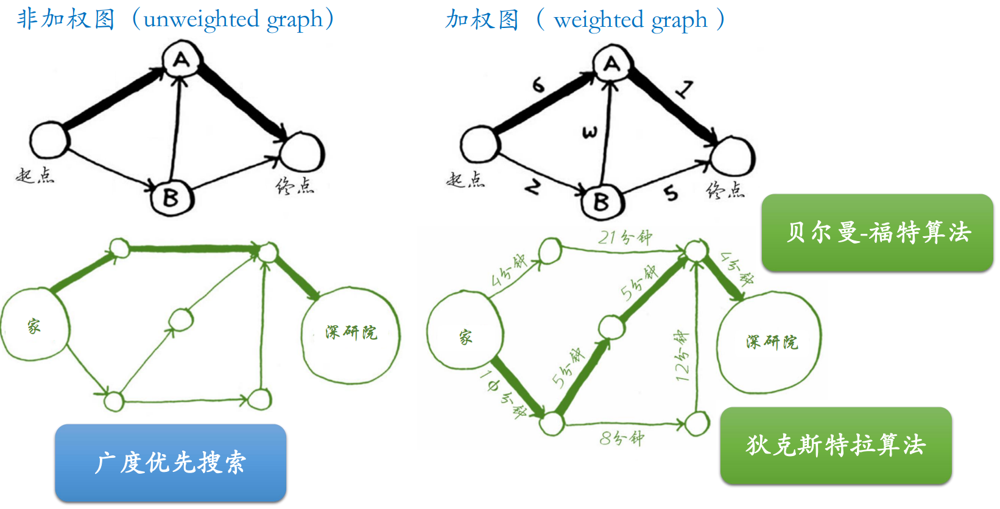

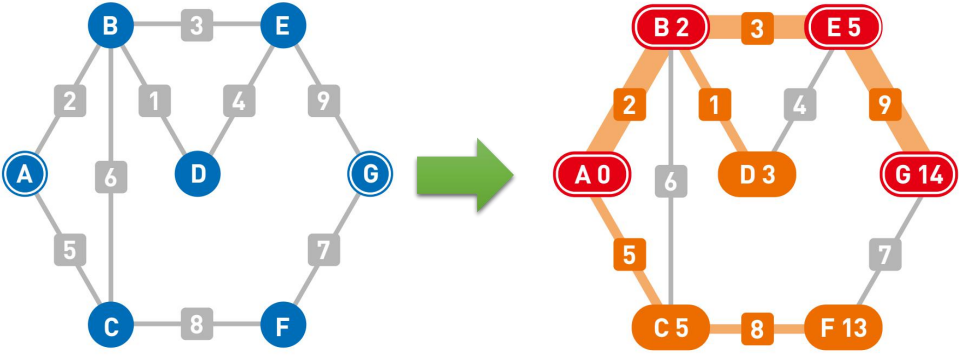

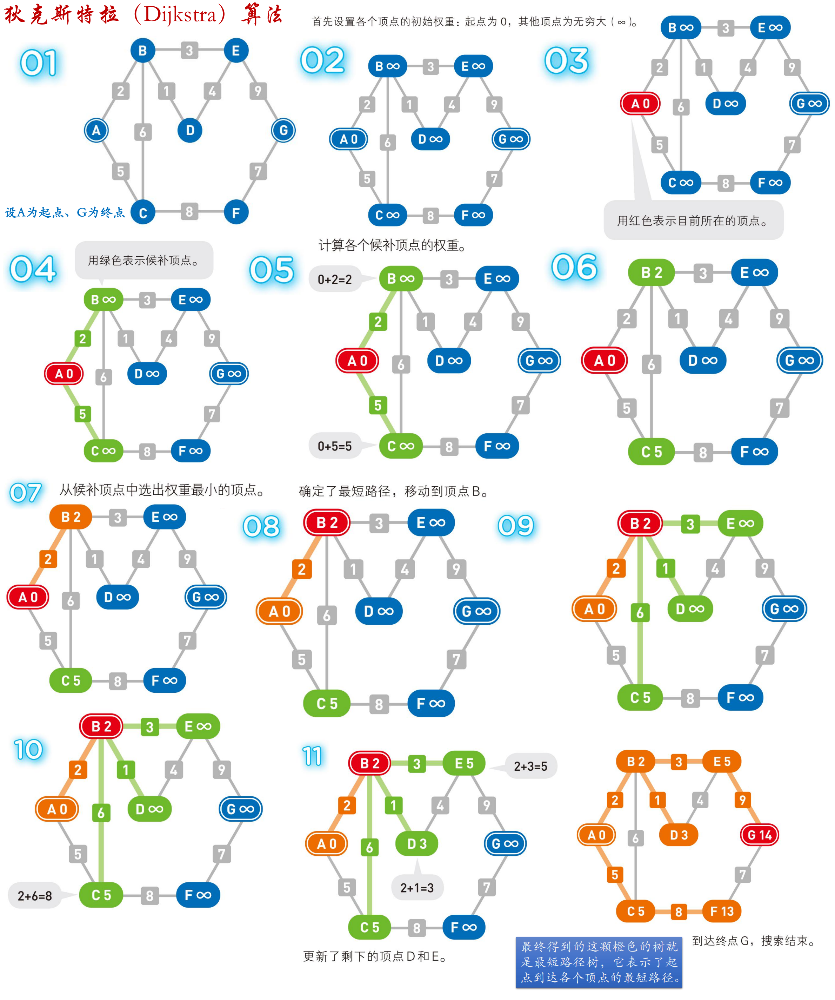

# 7. 狄克斯特拉 (Dijkstra) 算法

狄克斯特拉 (Dijkstra) 算法是一种求解最短路径问题的算法，使用它可以求得从起点到终点的路径中权重总和最小的路径。

狄克斯特拉算法的名称取自该算法的提出者埃德斯加·狄克斯特拉，他在 1972 年获得了图灵奖。

1. 设 A 为起点、G 为终点

2. 首先设置各个顶点的权重起点为,其他顶点为无穷大。

3. 用红色表示目前所在的顶点。

4. 用绿色表示候补顶点。

5. 计算各个候补顶点的权重。

7. 从候补顶点中选出权重最小的顶点。

8. 确定了最短路径，移动到顶点 B。

11. 更新了剩下的顶点 D 和 E。

12. 到达终点 G ,搜索结束。最终得到的这颗橙色的树就是最短路径树，它表示了起点到达各个顶点的最短路径。

### 算法包含 4 个步骤 : 

1. 找出“最便宜”的节点，即可在最短时间内到达的节点。

2. 更新该节点的邻居的开销。

3. 重复这个过程，直到对图中的每个节点都这样做。

4. 计算最终路径。

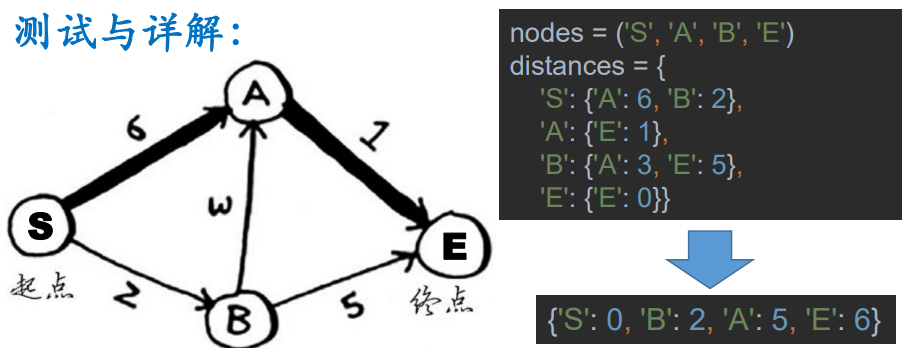

In [12]:
nodes = ('S', 'A', 'B', 'E')
distances = {
    'S': {'A': 6, 'B': 2},
    'A': {'E': 1},
    'B': {'A': 3, 'E': 5},
    'E': {'E': 0}}

unvisited = {node: None for node in nodes} #把None作为无穷大使用
visited = {}   #用来记录已经松弛过的数组
current = 'S'  #要找B点到其他点的距离
currentDistance = 0
unvisited[current] = currentDistance  #B到B的距离记为0
while True:
    print(current)
    for neighbour, distance in distances[current].items():
        if neighbour not in unvisited: continue   #被访问过了，跳出本次循环
        newDistance = currentDistance + distance  #新的距离
        if unvisited[neighbour] is None or unvisited[neighbour] > newDistance: #如果两个点之间的距离之前是无穷大或者新距离小于原来的距离
            unvisited[neighbour] = newDistance  #更新距离
    visited[current] = currentDistance  #这个点已经松弛过，记录
    del unvisited[current]  #从未访问过的字典中将这个点删除
    if not unvisited: break  #如果所有点都松弛过，跳出此次循环
    candidates = [node for node in unvisited.items() if node[1]]  #找出目前还有哪些点未松弛过
    current, currentDistance = sorted(candidates, key=lambda x: x[1])[0]  #找出目前可以用来松弛的点
    print(visited)
print(visited)

S
{'S': 0}
B
{'S': 0, 'B': 2}
A
{'S': 0, 'B': 2, 'A': 5}
E
{'S': 0, 'B': 2, 'A': 5, 'E': 6}


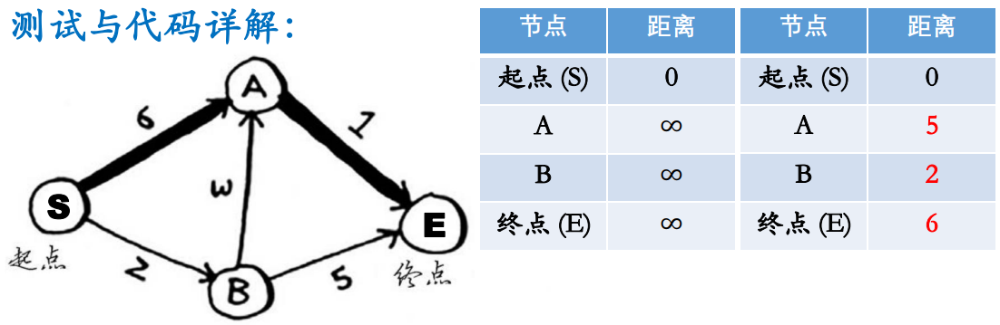

## 狄克斯特拉 (Dijkstra) 算法复杂度

将图的顶点数设为 n、边数设为 m，那么如果事先不进行任何处理，该算法的时间复杂度就是 $O(n^2)$ 。不过，如果对数据结构进行优化，那么时间复杂度就会变为 O(m + nlogn)。

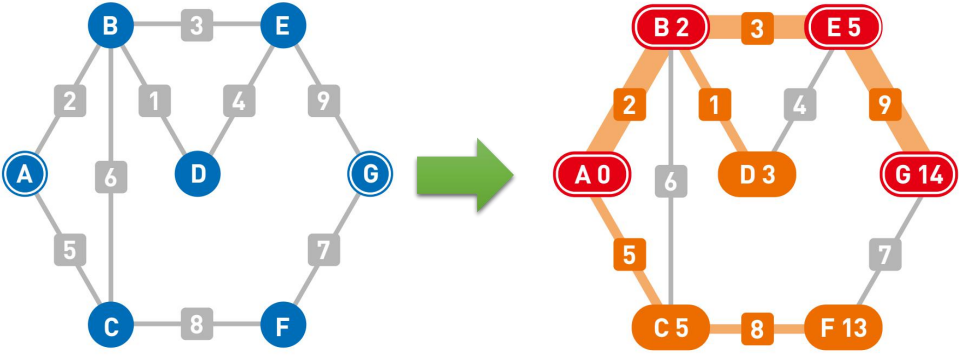

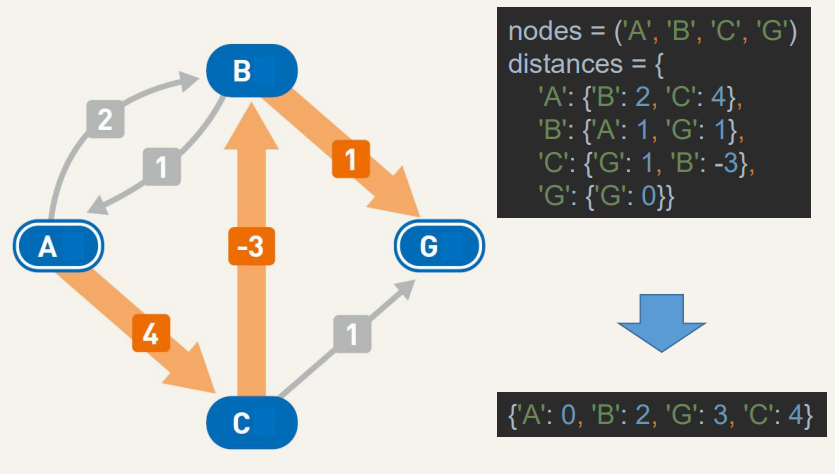

## 狄克斯特拉（Dijkstra）算法失效

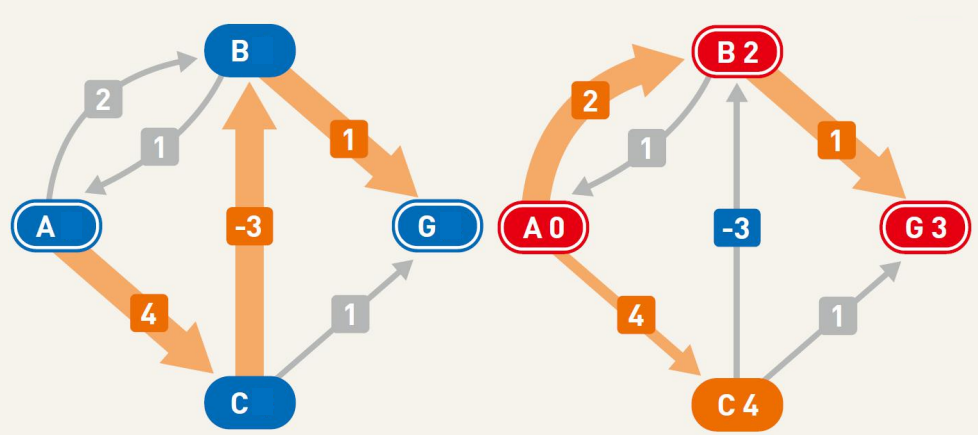

如果图中含有负数权重，狄克斯特拉算法可能会无法得出正确答案。

In [13]:
nodes = ('A', 'B', 'C', 'G')
distances = {
    'A': {'B': 2, 'C': 4},
    'B': {'A': 1, 'G': 1},
    'C': {'G': 1, 'B': -3},
    'G': {'G': 0}}


unvisited = {node: None for node in nodes} #把None作为无穷大使用
visited = {}   #用来记录已经松弛过的数组
current = 'A'  #要找B点到其他点的距离
currentDistance = 0
unvisited[current] = currentDistance  #B到B的距离记为0

while True:
    print(current)
    for neighbour, distance in distances[current].items():
        if neighbour not in unvisited: continue   #被访问过了，跳出本次循环
        newDistance = currentDistance + distance  #新的距离
        if unvisited[neighbour] is None or unvisited[neighbour] > newDistance: #如果两个点之间的距离之前是无穷大或者新距离小于原来的距离
            unvisited[neighbour] = newDistance  #更新距离
    visited[current] = currentDistance  #这个点已经松弛过，记录
    del unvisited[current]  #从未访问过的字典中将这个点删除
    if not unvisited: break  #如果所有点都松弛过，跳出此次循环
    candidates = [node for node in unvisited.items() if node[1]]  #找出目前还有哪些点未松弛过
    current, currentDistance = sorted(candidates, key=lambda x: x[1])[0]  #找出目前可以用来松弛的点
    print(visited)
print(visited)

A
{'A': 0}
B
{'A': 0, 'B': 2}
G
{'A': 0, 'B': 2, 'G': 3}
C
{'A': 0, 'B': 2, 'G': 3, 'C': 4}


# 8. 贝尔曼-福特 (Bellman-Ford) 算法

1. 贝尔曼-福特 (Bellman-Ford) 算法是一种在图中求解最短路径问题的算法。该算法可以处理包含负值权重的图。

2. 贝尔曼- 福特算法的名称取自其创始人理查德·贝尔曼和莱斯特·福特的名字。贝尔曼也因为提出了该算法中的一个重要分类“动态规划”而被世人所熟知。

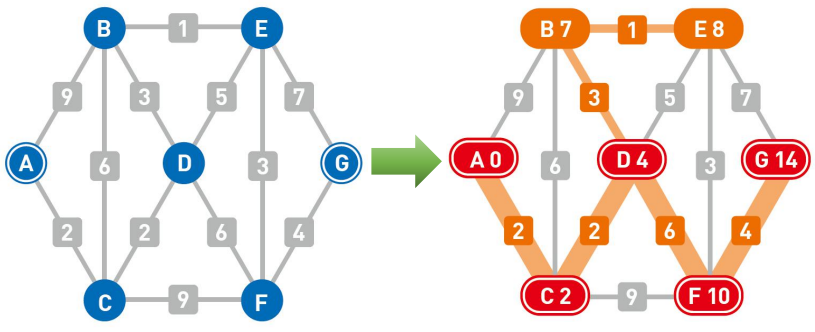

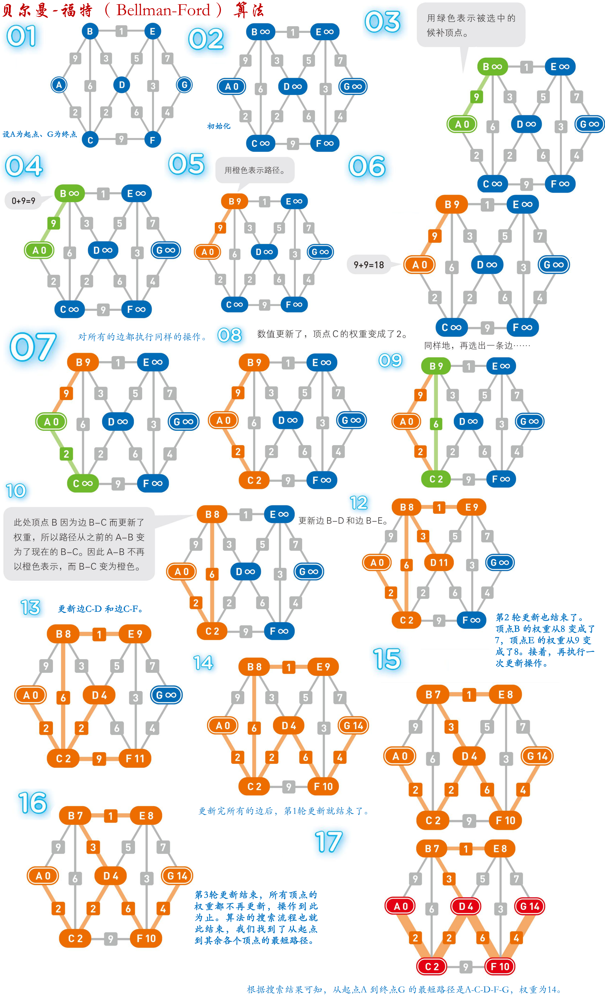

1. 设 A 为起点、G 为终点

2. 初始化

3. 用绿色表示被选中的候补顶点。

5. 用橙色表示路径。

7. 对所有的边都执行同样的操作。

8. 数值更新了,顶点C的权重变成了 2。

9. 同样地,再选出一条边・ ......

10. 此处顶点B因为边 B-C 而更新了权重，所以路径从之前的 A-B 变为了现在的 B-C。因此 A-B 不再以橙色表示，而 B-C 变为橙色。

12. 更新边 B-D 和边 B-E。

13. 更新边 C-D 和边 C-F。

14. 更新完所有的边后，第 1 轮更新就结束了。

15. 第 2 轮更新也结束了。顶点 B 的权重从 8 变成了 7，顶点 E 的权重从 9 变成了 8。接着，再执行一次更新操作。

16. 第 3 轮更新结束，所有顶点的权重都不再更新，操作到此为止。算法的搜索流程也就此结束，我们找到了从起点到其余各个顶点的最短路径。

17. 根据搜索结果可知，从起点 A 到终点 G 的最短路径是 A-C-D-F-G，权重为 14。

## 贝尔曼-福特 (Bellman-Ford) 算法复杂度

将图的顶点数设为 n 、边数设为 m，该算法经过 n 轮更新操作后就会停止，而在每轮更新操作中都需要对各个边进行1次确认，因此1轮更新所花费的时间就是 O(m) ，整体的时间复杂度就是 O(nm)。

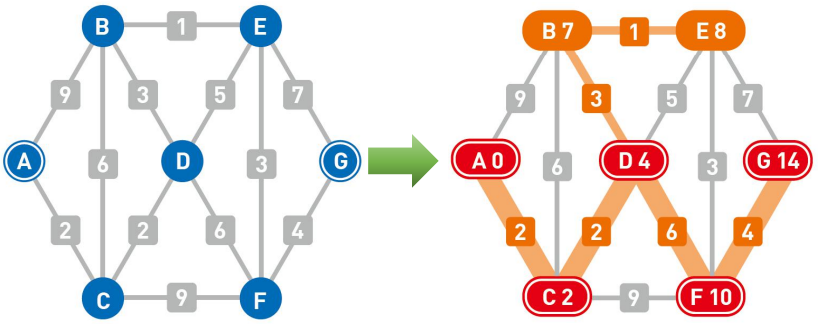

## 含有负值权重的最短路径问题

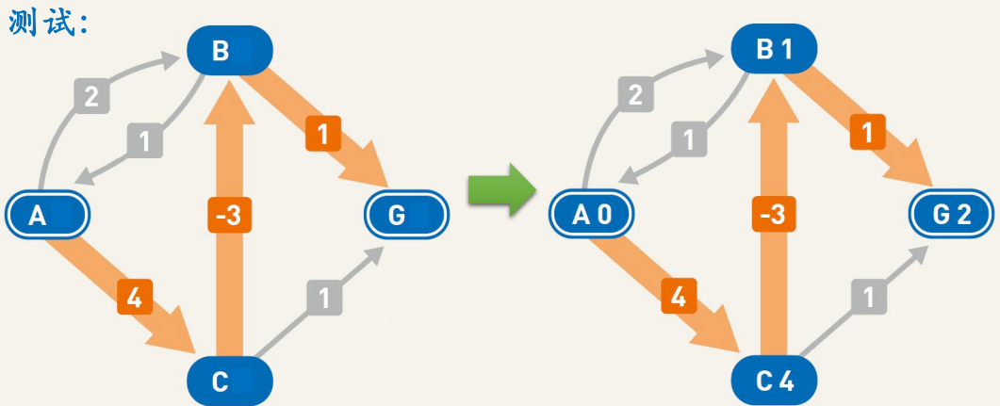